In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import stitch
import utils
import features

In [2]:
def convertResult(img):
    '''Because of your images which were loaded by opencv, 
    in order to display the correct output with matplotlib, 
    you need to reduce the range of your floating point image from [0,255] to [0,1] 
    and converting the image from BGR to RGB:'''
    img = np.array(img,dtype=float)/float(255)
    img = img[:,:,::-1]
    return img

In [3]:
#load images

image1 = cv2.imread(r"C:\Users\yl\Desktop\sucai\cd\TDMovieOut.0.jpg")
image2 = cv2.imread(r"C:\Users\yl\Desktop\sucai\cd\TDMovieOut.1.jpg")

md1 = cv2.imread(r"C:\Users\yl\Desktop\sucai\mb\123 (1).jpg")
md2 = cv2.imread(r"C:\Users\yl\Desktop\sucai\mb\123 (2).jpg")

# "C:\Users\yl\Desktop\sucai\TDMovieOut.7.jpg"

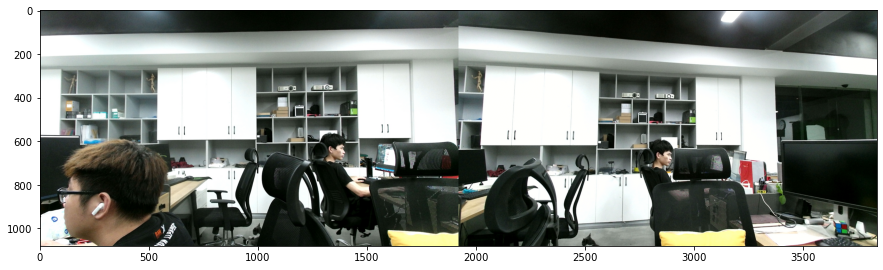

In [4]:
plt_img = np.concatenate((image1, image2), axis=1)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(plt_img))

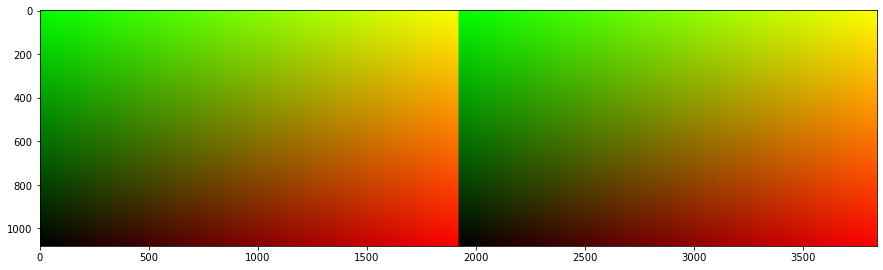

In [5]:
plt_img = np.concatenate((md1, md2), axis=1)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(plt_img))

In [6]:
grayImage1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
grayImage2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
surgmd1 = cv2.xfeatures2d.SURF_create()
surgmd2 = cv2.xfeatures2d.SURF_create()

In [7]:
k0, f0 = surgmd1.detectAndCompute(grayImage1, None)
f0 = np.float32(f0)
k1, f1 = surgmd2.detectAndCompute(grayImage2, None)
f1 = np.float32(f1)

In [11]:
import copy
im1 = copy.copy(image1)
im2 = copy.copy(image2)
cv2.drawKeypoints(im1, k0, im1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(im2, k1, im2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

array([[[ 97,  93,  82],
        [ 96,  92,  81],
        [ 95,  91,  80],
        ...,
        [ 49,  57,  46],
        [ 49,  57,  46],
        [ 49,  57,  46]],

       [[ 94,  90,  79],
        [ 93,  91,  80],
        [ 93,  91,  80],
        ...,
        [ 49,  57,  46],
        [ 51,  57,  46],
        [ 52,  60,  49]],

       [[ 89,  87,  77],
        [ 88,  87,  77],
        [ 88,  88,  76],
        ...,
        [ 53,  59,  48],
        [ 55,  59,  48],
        [ 51,  57,  46]],

       ...,

       [[ 24,  35,  27],
        [ 22,  33,  25],
        [ 19,  30,  22],
        ...,
        [104, 136, 141],
        [ 97, 130, 133],
        [ 85, 118, 121]],

       [[ 23,  36,  28],
        [ 19,  32,  24],
        [ 16,  27,  19],
        ...,
        [ 98, 130, 135],
        [ 92, 125, 128],
        [ 79, 112, 115]],

       [[ 22,  35,  27],
        [ 20,  33,  25],
        [ 16,  27,  19],
        ...,
        [ 93, 125, 130],
        [ 85, 118, 121],
        [ 73, 106, 109]]

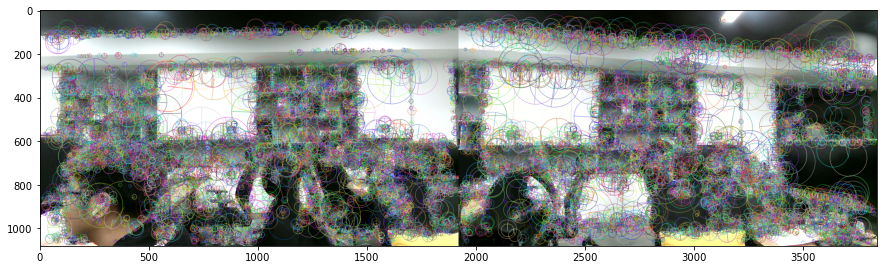

In [12]:
plt_img = np.concatenate((im1, im2), axis=1)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(plt_img))

In [13]:
#matching features using BruteForce 
mat=features.matchFeatures(f0,f1,ratio=0.6,opt='BF')
# featureMatcher = cv2.DescriptorMatcher_create("BruteForce")

In [14]:
#Computing Homography matrix and mask
H,matMask=features.generateHomography(image1,image2)

In [16]:

def drawMatches(src_img, src_kp, dst_img, dst_kp, matches, matchesMask):
    """/*
    /*其中参数如下：
    * img1 – 源图像1
    * keypoints1 –源图像1的特征点.
    * img2 – 源图像2.
    * keypoints2 – 源图像2的特征点
    * matches1to2 – 源图像1的特征点匹配源图像2的特征点[matches[i]] .
    * outImg – 输出图像具体由flags决定.
    * matchColor – 匹配的颜色（特征点和连线),若matchColor==Scalar::all(-1)，颜色随机.
    * singlePointColor – 单个点的颜色，即未配对的特征点，若matchColor==Scalar::all(-1)，颜色随机.
    matchesMask – Mask决定哪些点将被画出，若为空，则画出所有匹配点.
    * flags – Fdefined by DrawMatchesFlags.

    */
    """
    draw_params = dict(
        matchColor=(0, 255, 0),  # draw matches in green color
        singlePointColor=None,
        matchesMask=matchesMask[:100],  # draw only inliers
        flags=2,
    )
    return cv2.drawMatches(
        src_img, src_kp, dst_img, dst_kp, matches[:100], None, **draw_params
    )



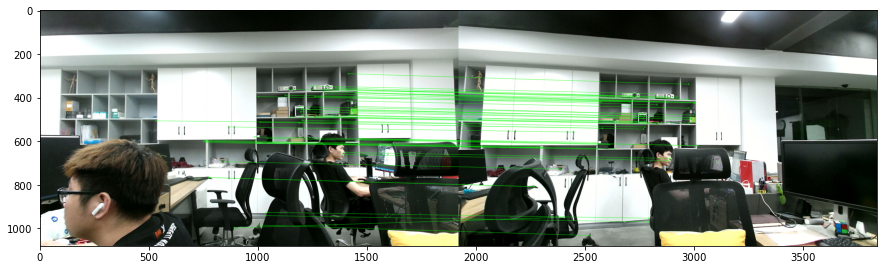

In [19]:
#draw matches
img=drawMatches(image1,k0,image2,k1,mat,matMask)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(img))

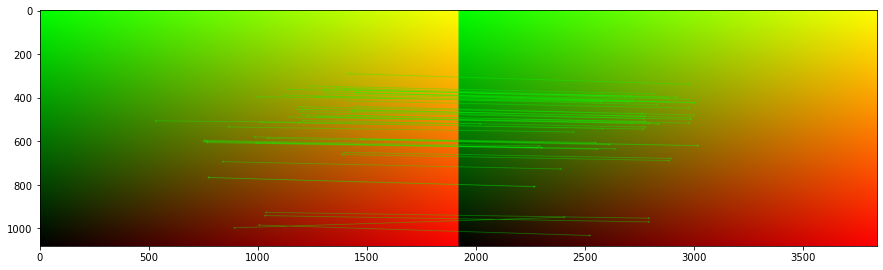

In [20]:
#draw matches
img=drawMatches(md1,k0,md2,k1,mat,matMask)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(img))

In [21]:
print(len(k0),len(k1))

8441 8763


In [22]:
#wrap 2 image
#choose list_images[0] as desination
pano,non_blend,left_side,right_side=stitch.warpTwoImages(image1,image2,True)

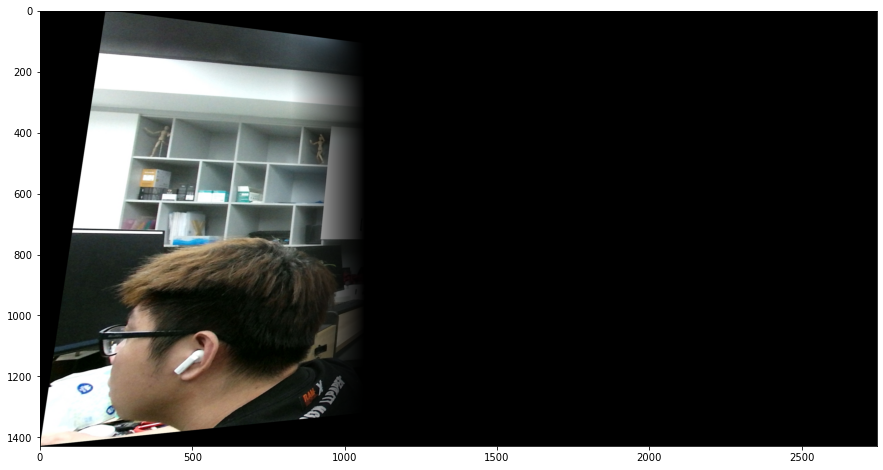

In [23]:
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(left_side))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


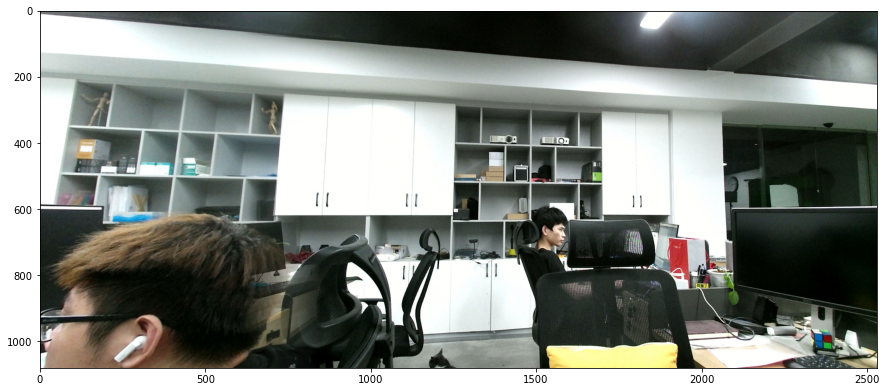

In [24]:
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(pano))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


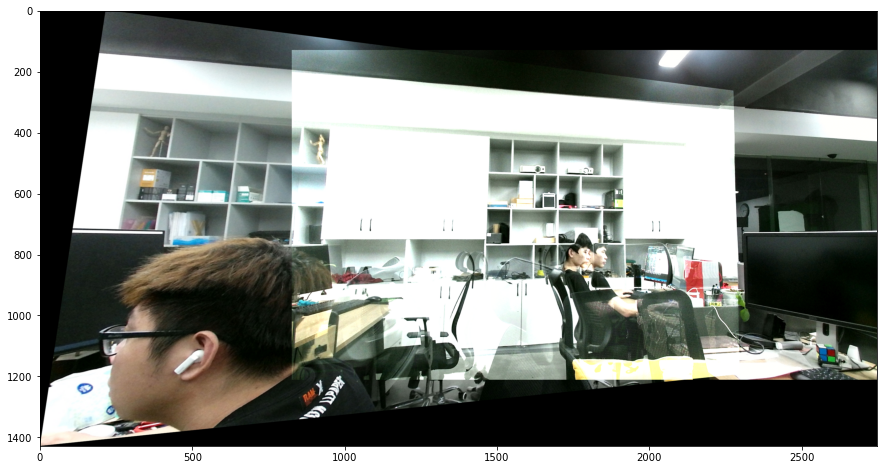

In [25]:
 
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


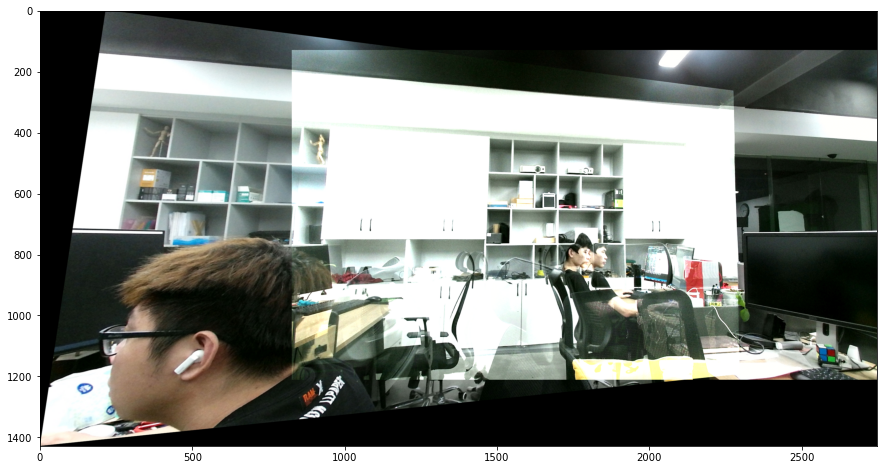

In [26]:
#if you choose list_images[1] as desination, the output look like this
_,non_blend2,_,_=stitch.warpTwoImages(image1,image2,True)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend2))

123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


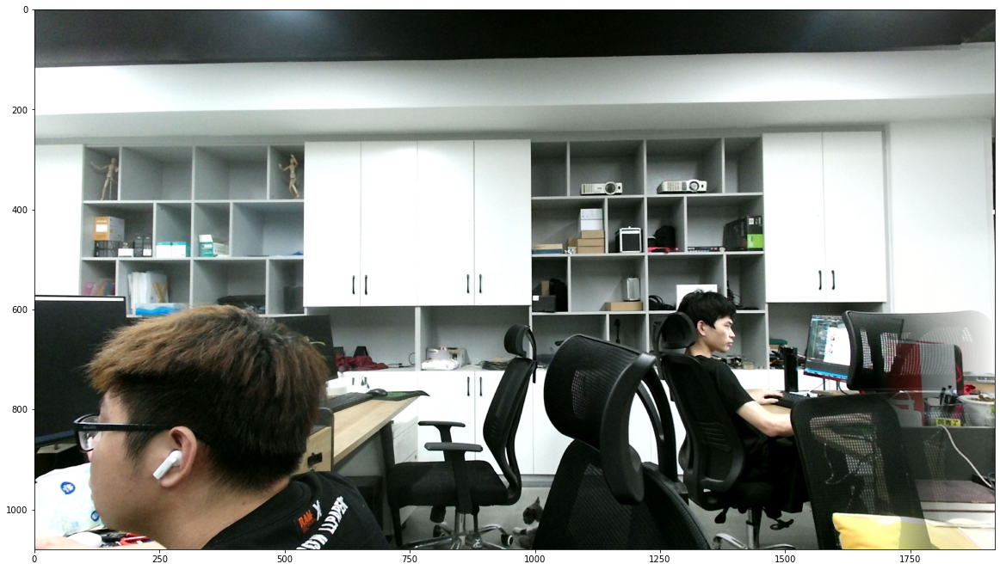

In [27]:
#multi stitching
list_images = [image1,image2]
panorama=stitch.multiStitching(list_images)
plt.figure(figsize=(20,20))
plt.imshow(convertResult(panorama))

In [31]:
import stitch2

123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


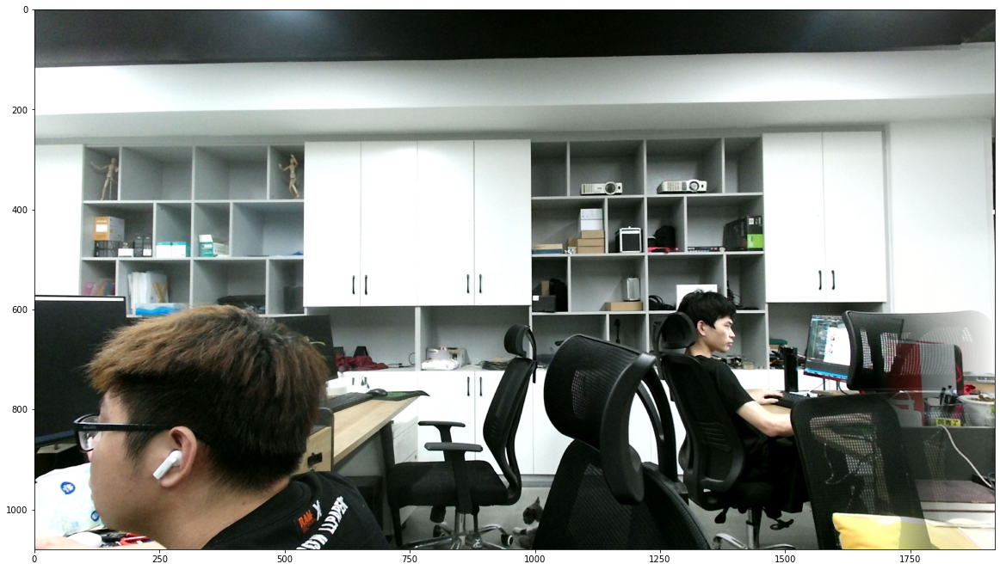

In [32]:
#multi stitching
list_images = [image1,image2]
panorama=stitch2.multiStitching(list_images)
plt.figure(figsize=(20,20))
plt.imshow(convertResult(panorama))

In [33]:
def ceshi():
    print("154fs55")

In [34]:
ceshi()

154fs55


In [47]:
# get height and width of two images
height_src, width_src = image1.shape[:2]
height_dst, width_dst = image2.shape[:2]


In [48]:
# #multi stitching
# panorama, _, _, _ = warpTwoImages(image1,image2,H,matMask)
# plt.figure(figsize=(20,20))
# plt.imshow(convertResult(panorama))

print(height_src, width_src)
print(height_dst, width_dst)


1080 1920
1080 1920


In [49]:
# extract conners of two images: top-left, bottom-left, bottom-right, top-right
pts1 = np.float32(
    [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
).reshape(-1, 1, 2)
pts2 = np.float32(
    [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
).reshape(-1, 1, 2)

In [50]:
pts1_ = cv2.perspectiveTransform(pts1, H)

In [53]:
pts = np.concatenate((pts1_, pts2), axis=0)

# plt.figure(figsize=(20,20))
# plt.imshow(convertResult(pts))

In [54]:
# find max min of x,y coordinate
[xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
[_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
t = [-xmin, -ymin]

In [55]:
if pts[0][0][0] < 0:
    side = "left"
    width_pano = width_dst + t[0]
else:
    width_pano = int(pts1_[3][0][0])
    side = "right"
height_pano = ymax - ymin

In [56]:
Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])

In [60]:
src_img_warped = cv2.warpPerspective(
            image1, Ht.dot(H), (width_pano, height_pano)
        )

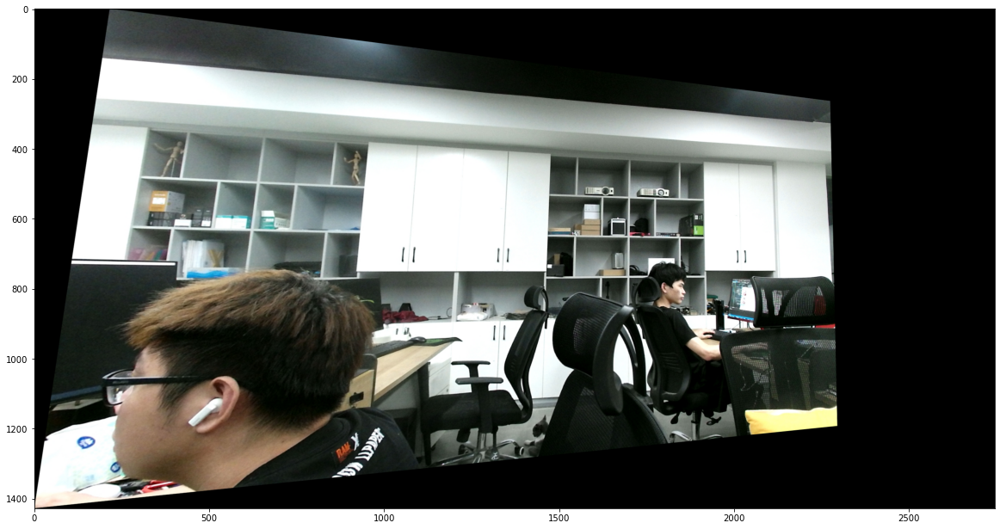

In [61]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(src_img_warped))

In [63]:
src_img_warped_md = cv2.warpPerspective(
            md1, Ht.dot(H), (width_pano, height_pano)
        )

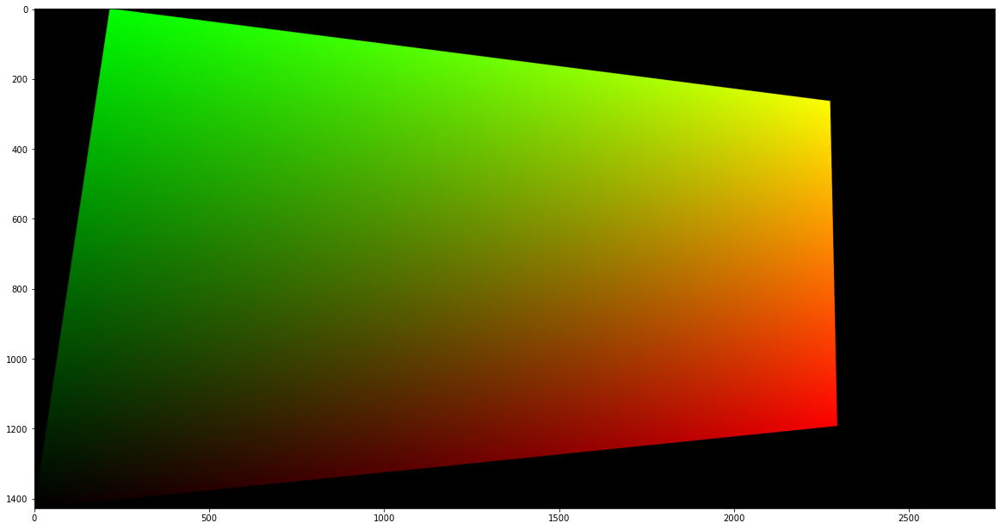

In [64]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(src_img_warped_md))

In [67]:
dst_img_rz = np.zeros((height_pano, width_pano, 3))

In [76]:
if side == "left":
    dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = image2
else:
    dst_img_rz[t[1] : height_src + t[1], :width_dst] = image2

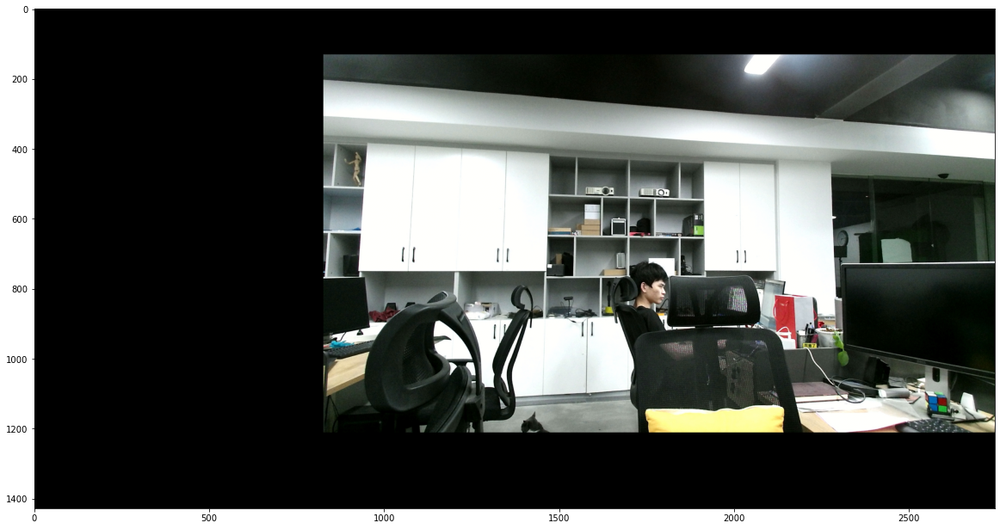

In [77]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(dst_img_rz))

In [78]:
showstep=False
pano, nonblend, leftside, rightside = stitch2.panoramaBlending(
            dst_img_rz, src_img_warped, width_dst, side, showstep=showstep
        )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


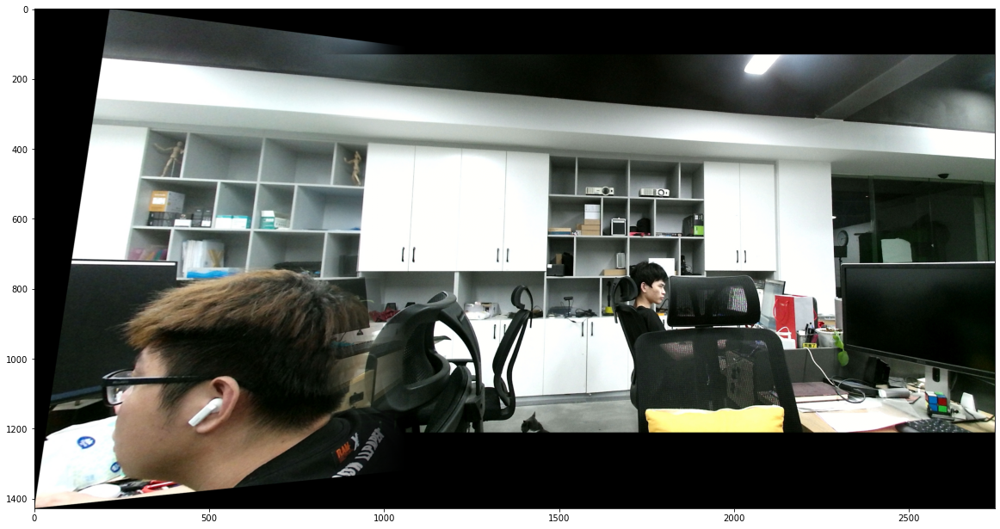

In [79]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(pano))

In [80]:
print(type(pano),type(nonblend),type(leftside),type(rightside) )

<class 'numpy.ndarray'> <class 'NoneType'> <class 'NoneType'> <class 'NoneType'>


In [81]:
pano = stitch2.crop(pano, height_dst, pts)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


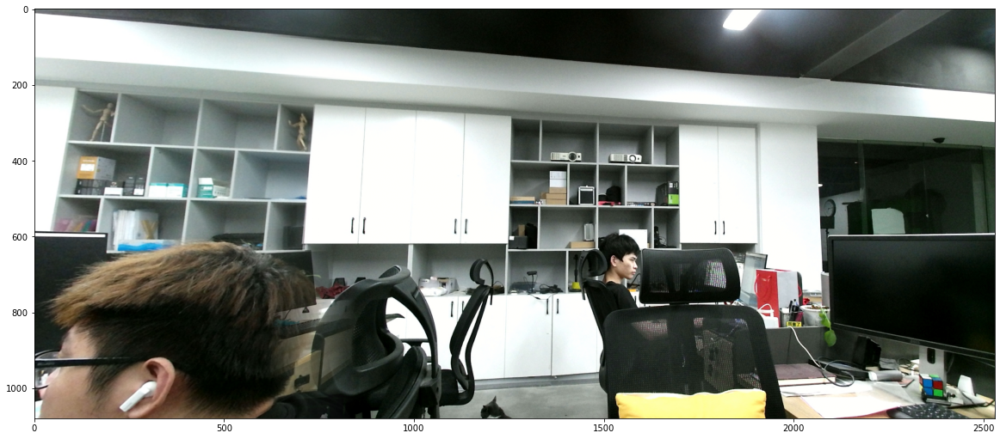

In [82]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(pano))

In [83]:
Kongzhi = cv2.imread(r"C:\Users\yl\Desktop\sucai\mb\Kongzhi.jpg")
yingshe = cv2.imread(r"C:\Users\yl\Desktop\sucai\mb\yingshe.jpg")

In [85]:
height_src, width_src = yingshe.shape[:2]
height_dst, width_dst = Kongzhi.shape[:2]
print(type(height_src),type(width_src),height_src,width_src)
print(type(height_dst),type(width_dst),height_dst,width_dst)

<class 'int'> <class 'int'> 1080 1920
<class 'int'> <class 'int'> 1080 1920


In [86]:
src_img = yingshe
dst_img = Kongzhi

In [88]:
# aply homography to conners of src_img
pts1_ = cv2.perspectiveTransform(pts1, H)
pts = np.concatenate((pts1_, pts2), axis=0)

# find max min of x,y coordinate
[xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
[_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
t = [-xmin, -ymin]

# top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
# otherwise side=right
# source image is merged to the left side or right side of destination image
if pts[0][0][0] < 0:
    side = "left"
    width_pano = width_dst + t[0]
else:
    width_pano = int(pts1_[3][0][0])
    side = "right"
height_pano = ymax - ymin

# Translation
# https://stackoverflow.com/a/20355545
Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
src_img_warped = cv2.warpPerspective(
    src_img, Ht.dot(H), (width_pano, height_pano)
)
# generating size of dst_img_rz which has the same size as src_img_warped
dst_img_rz = np.zeros((height_pano, width_pano, 3))
if side == "left":
    dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
else:
    dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

# blending panorama
pano, nonblend, leftside, rightside = stitch2.panoramaBlending(
    dst_img_rz, src_img_warped, width_dst, side, showstep=showstep
)

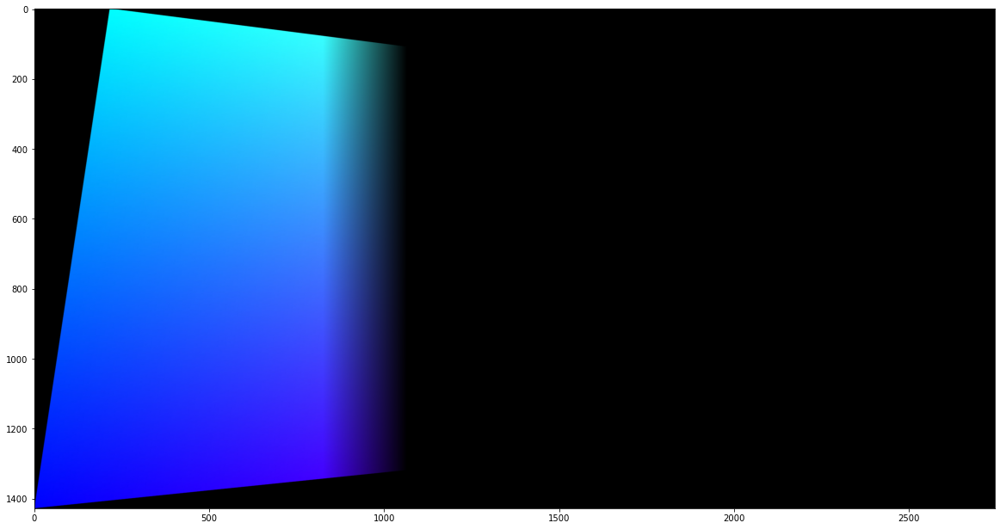

In [89]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(pano))

In [91]:
pano = stitch2.crop(pano, height_dst, pts)

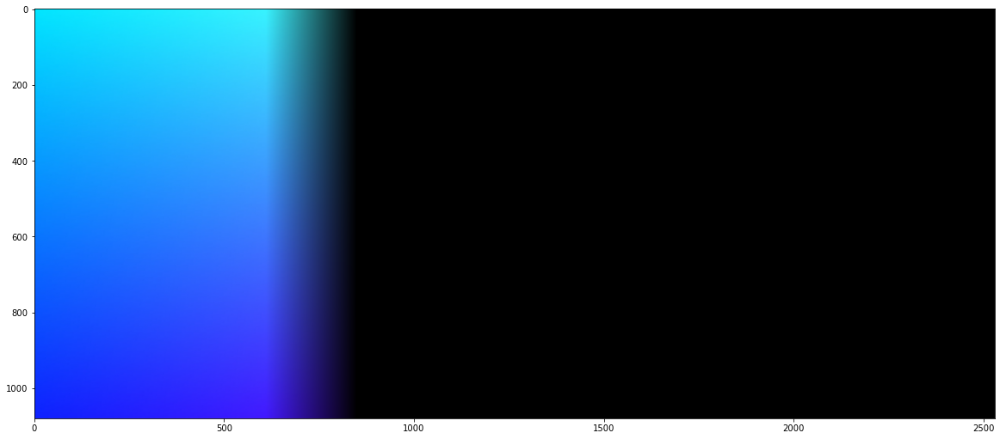

In [92]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(pano))

In [93]:
import copy
moban1 = copy.copy(pano)

In [94]:
src_img = Kongzhi
dst_img = yingshe

In [95]:
# aply homography to conners of src_img
pts1_ = cv2.perspectiveTransform(pts1, H)
pts = np.concatenate((pts1_, pts2), axis=0)

# find max min of x,y coordinate
[xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
[_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
t = [-xmin, -ymin]

# top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
# otherwise side=right
# source image is merged to the left side or right side of destination image
if pts[0][0][0] < 0:
    side = "left"
    width_pano = width_dst + t[0]
else:
    width_pano = int(pts1_[3][0][0])
    side = "right"
height_pano = ymax - ymin

# Translation
# https://stackoverflow.com/a/20355545
Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
src_img_warped = cv2.warpPerspective(
    src_img, Ht.dot(H), (width_pano, height_pano)
)
# generating size of dst_img_rz which has the same size as src_img_warped
dst_img_rz = np.zeros((height_pano, width_pano, 3))
if side == "left":
    dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
else:
    dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

# blending panorama
pano, nonblend, leftside, rightside = stitch2.panoramaBlending(
    dst_img_rz, src_img_warped, width_dst, side, showstep=showstep
)

In [96]:
pano = stitch2.crop(pano, height_dst, pts)

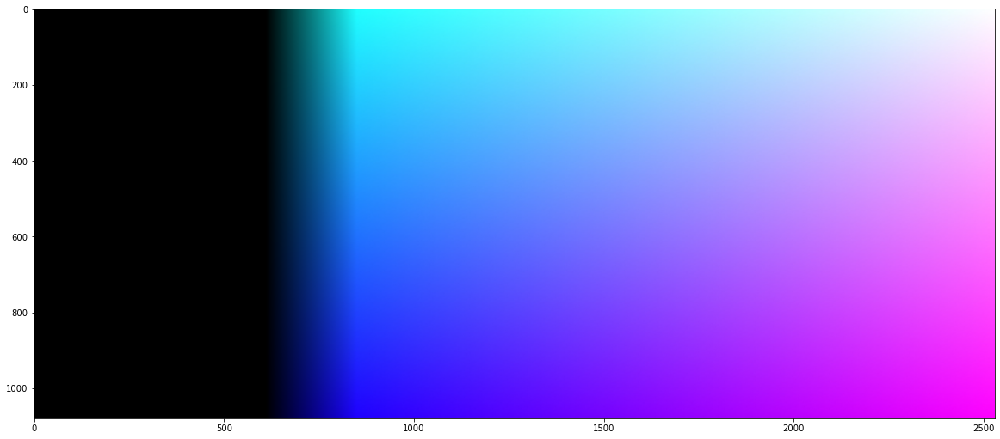

In [97]:
plt.figure(figsize=(20,20))
plt.imshow(convertResult(pano))

In [98]:
moban2 = copy.copy(pano)

In [99]:
cv2.imwrite( "result2\moban1.jpg", moban1)
cv2.imwrite( "result2\moban2.jpg", moban2)

True